In [1]:
## tutorial: https://stereopy.readthedocs.io/en/latest/Tutorials/clustering.html#
import stereo as st
import os
import re
import anndata

os.chdir('/scratch/u/qqiu/project/multiomics/stereo_seq/result/')

2023-03-01 12:22:35.133040: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


In [4]:
gef = '952BR_E4/04.tissuecut/SS200000952BR_E4.tissue.gef'
#st.io.read_gef_info(E4_gef)

In [ ]:
data = st.io.read_gef(file_path=gef, bin_size=50)


[2023-03-01 12:23:40][Stereo][155190][140083628488512][reader][518][INFO]: read_gef begin ...
[2023-03-01 12:23:47][Stereo][155190][140083628488512][reader][591][INFO]: the matrix has 81080 cells, and 17190 genes.


In [ ]:
adata = st.io.stereo_to_anndata(data, flavor='seurat', output='952BR_E4.bin50.h5ad')

In [8]:
adata.write_csvs("952BR_E4.obs", skip_data=False)

writing .csv files to obs


In [21]:
data

[2023-02-03 14:00:39][Stereo][57180][139909146240832][st_pipeline][40][INFO]: start to run cal_qc...
[2023-02-03 14:00:39][Stereo][57180][139909146240832][st_pipeline][43][INFO]: cal_qc end, consume time 0.1343s.


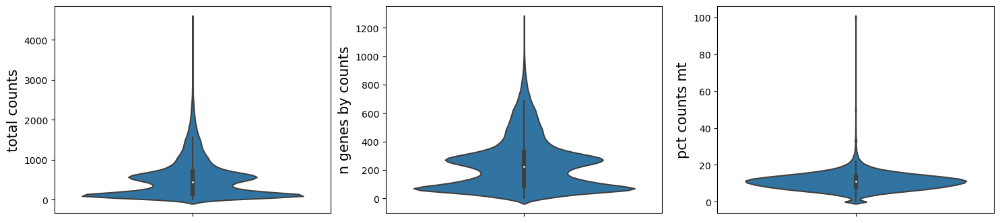

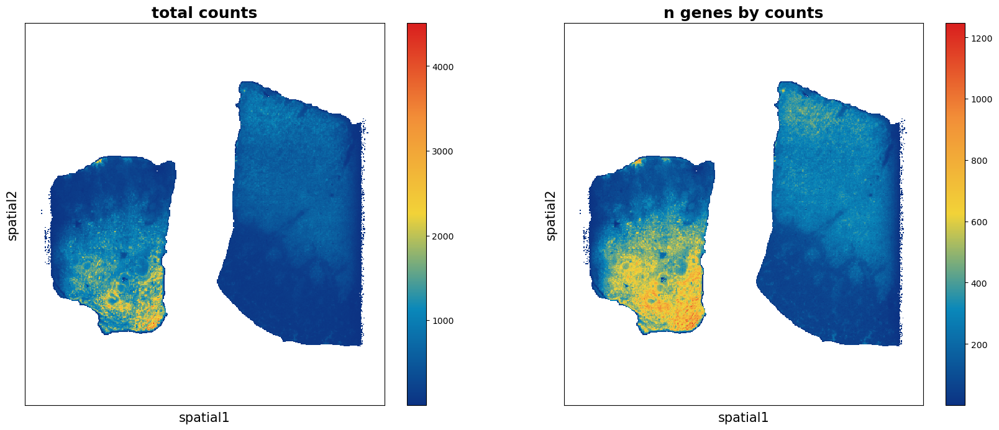

In [5]:
## quality control
data.tl.cal_qc()
data.plt.violin()
data.plt.spatial_scatter()

In [26]:
pattern = re.compile(r'^Rp[Sl]\d+|^Ig|^[Mm]t-')
black_gene_list = [i for i in data.gene_names if pattern.search(i)]
remain_gene_list = [i for i in data.gene_names if i not in black_gene_list]
len(remain_gene_list)

17094

In [27]:
## filtering
data.tl.filter_cells(min_gene=50, min_n_genes_by_counts=3, pct_counts_mt=30, inplace=True)
data.tl.filter_genes(min_cell=3, gene_list=remain_gene_list, inplace=True)
data.exp_matrix.shape

[2023-03-01 11:40:56][Stereo][11537][140510587909952][st_pipeline][40][INFO]: start to run filter_cells...
[2023-03-01 11:40:57][Stereo][11537][140510587909952][st_pipeline][43][INFO]: filter_cells end, consume time 1.3990s.
[2023-03-01 11:40:57][Stereo][11537][140510587909952][st_pipeline][40][INFO]: start to run filter_genes...
[2023-03-01 11:40:57][Stereo][11537][140510587909952][st_pipeline][43][INFO]: filter_genes end, consume time 0.2846s.


(77323, 16072)

In [28]:
## normalization
data.tl.raw_checkpoint() # save raw exp_matrix

#data.tl.sctransform(n_genes=2000, res_key="sct")
#data.tl.highly_variable_genes(min_mean=0.0125, max_mean=3,min_disp=0.5,
#                              n_top_genes=2000, res_key='hvg_sct')
#data.plt.highly_variable_genes(res_key='hvg_sct')

[2023-02-03 14:00:44][Stereo][57180][139909146240832][st_pipeline][40][INFO]: start to run normalize_total...
[2023-02-03 14:00:44][Stereo][57180][139909146240832][st_pipeline][43][INFO]: normalize_total end, consume time 0.1664s.
[2023-02-03 14:00:44][Stereo][57180][139909146240832][st_pipeline][40][INFO]: start to run log1p...
[2023-02-03 14:00:44][Stereo][57180][139909146240832][st_pipeline][43][INFO]: log1p end, consume time 0.0749s.
[2023-02-03 14:00:44][Stereo][57180][139909146240832][st_pipeline][40][INFO]: start to run highly_variable_genes...
[2023-02-03 14:00:44][Stereo][57180][139909146240832][st_pipeline][43][INFO]: highly_variable_genes end, consume time 0.4010s.


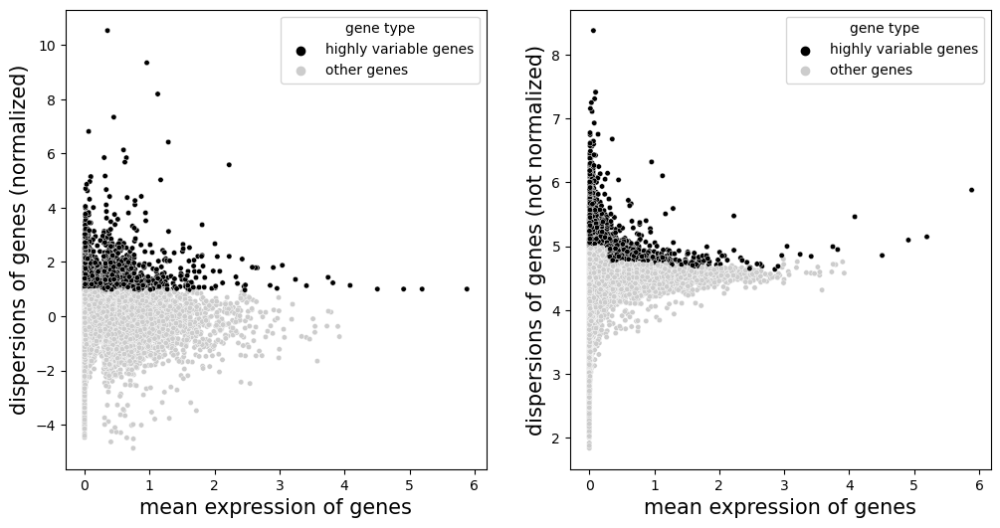

In [9]:
data.tl.normalize_total(target_sum=10000, res_key="nt")
data.tl.log1p(res_key="log1p")

data.tl.highly_variable_genes(min_mean=0.0125, max_mean=3,min_disp=0.5,
                              n_top_genes=2000, res_key='hvg_nt')
data.plt.highly_variable_genes(res_key='hvg_nt')

In [10]:
data.tl.scale(max_value=10, zero_center=True)
data.tl.pca(use_highly_genes=True, n_pcs=20, res_key='pca', hvg_res_key="hvg_nt")
data.tl.neighbors(pca_res_key='pca', n_pcs=20, res_key='neighbors', n_jobs=6)
data.tl.umap(pca_res_key='pca', neighbors_res_key='neighbors', res_key='umap')

[2023-02-03 14:00:45][Stereo][57180][139909146240832][st_pipeline][40][INFO]: start to run scale...
[2023-02-03 14:00:56][Stereo][57180][139909146240832][scale][52][INFO]: Truncate at max_value 10
[2023-02-03 14:00:57][Stereo][57180][139909146240832][st_pipeline][43][INFO]: scale end, consume time 12.1150s.
[2023-02-03 14:00:57][Stereo][57180][139909146240832][st_pipeline][40][INFO]: start to run pca...
[2023-02-03 14:01:08][Stereo][57180][139909146240832][st_pipeline][43][INFO]: pca end, consume time 10.6040s.
[2023-02-03 14:01:08][Stereo][57180][139909146240832][st_pipeline][40][INFO]: start to run neighbors...
[2023-02-03 14:01:31][Stereo][57180][139909146240832][st_pipeline][43][INFO]: neighbors end, consume time 23.3247s.
[2023-02-03 14:01:31][Stereo][57180][139909146240832][st_pipeline][40][INFO]: start to run umap...


	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs


[2023-02-03 14:02:06][Stereo][57180][139909146240832][st_pipeline][43][INFO]: umap end, consume time 34.4465s.


[2023-02-03 14:02:06][Stereo][57180][139909146240832][st_pipeline][40][INFO]: start to run louvain...
[2023-02-03 14:02:06][Stereo][57180][139909146240832][_louvain][99][INFO]:     using the "louvain" package of Traag (2017)
[2023-02-03 14:02:15][Stereo][57180][139909146240832][st_pipeline][43][INFO]: louvain end, consume time 9.5263s.


<AxesSubplot:title={'center':'louvain_0.3'}, xlabel='umap1', ylabel='umap2'>

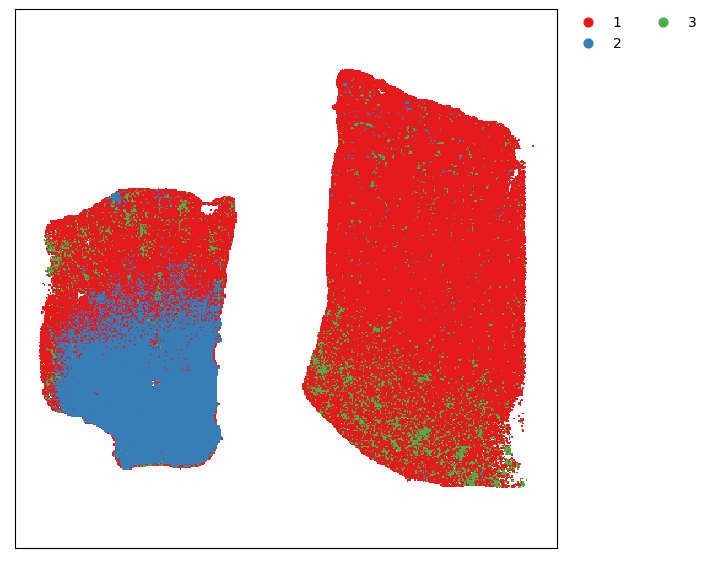

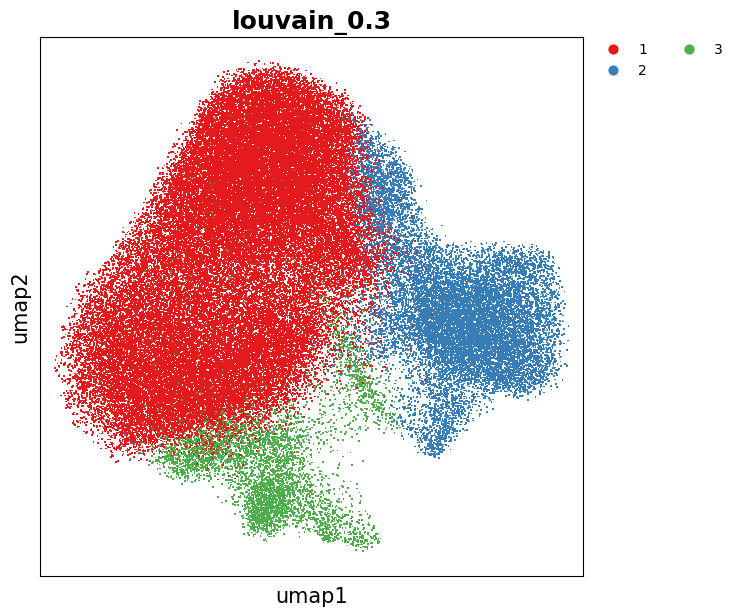

In [11]:
data.tl.louvain(neighbors_res_key='neighbors', res_key='louvain_0.3', resolution=0.3)
data.plt.cluster_scatter(res_key='louvain_0.3')
data.plt.umap(res_key='umap', cluster_key='louvain_0.3')

[2023-02-03 14:02:17][Stereo][57180][139909146240832][st_pipeline][40][INFO]: start to run louvain...
[2023-02-03 14:02:17][Stereo][57180][139909146240832][_louvain][99][INFO]:     using the "louvain" package of Traag (2017)
[2023-02-03 14:02:30][Stereo][57180][139909146240832][st_pipeline][43][INFO]: louvain end, consume time 13.0874s.


<AxesSubplot:title={'center':'louvain_0.8'}, xlabel='umap1', ylabel='umap2'>

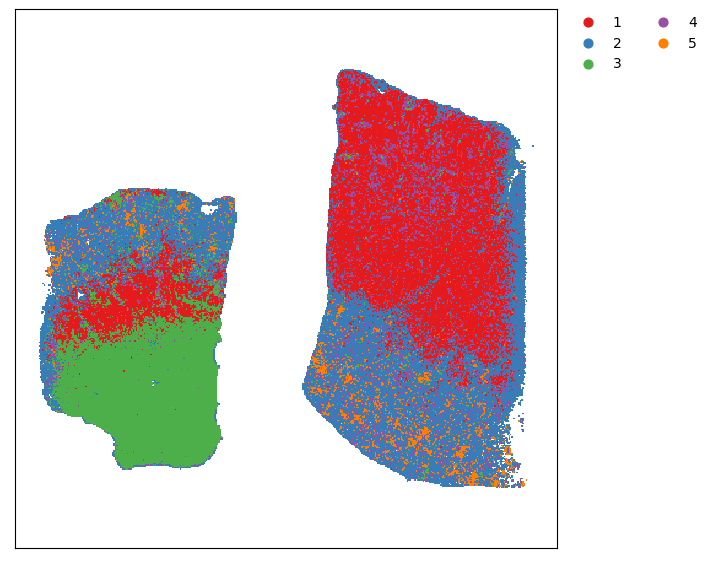

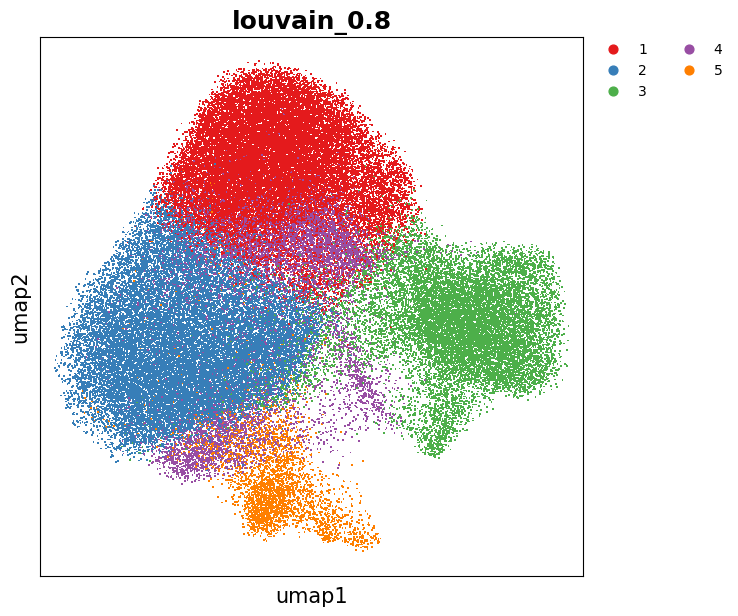

In [12]:
data.tl.louvain(neighbors_res_key='neighbors', res_key='louvain_0.8', resolution=0.8)
data.plt.cluster_scatter(res_key='louvain_0.8')
data.plt.umap(res_key='umap', cluster_key='louvain_0.8')

[2023-02-03 14:02:31][Stereo][57180][139909146240832][st_pipeline][40][INFO]: start to run leiden...
[2023-02-03 14:02:49][Stereo][57180][139909146240832][st_pipeline][43][INFO]: leiden end, consume time 18.0267s.


<AxesSubplot:title={'center':'leiden_0.2'}, xlabel='umap1', ylabel='umap2'>

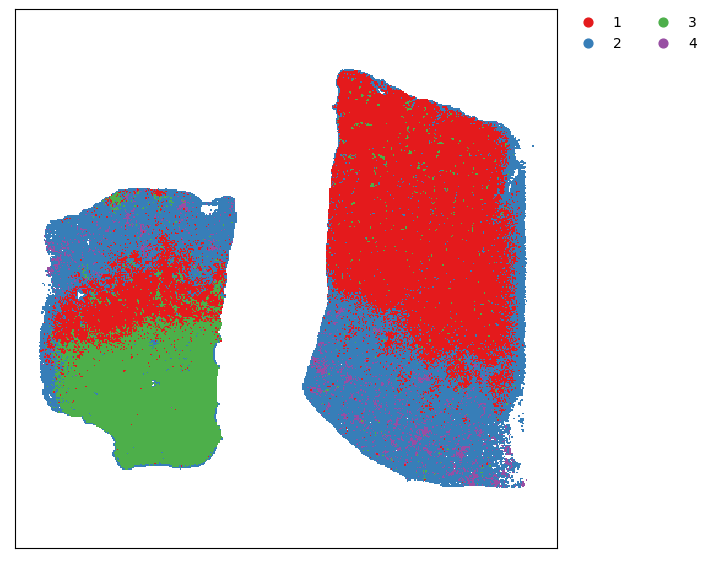

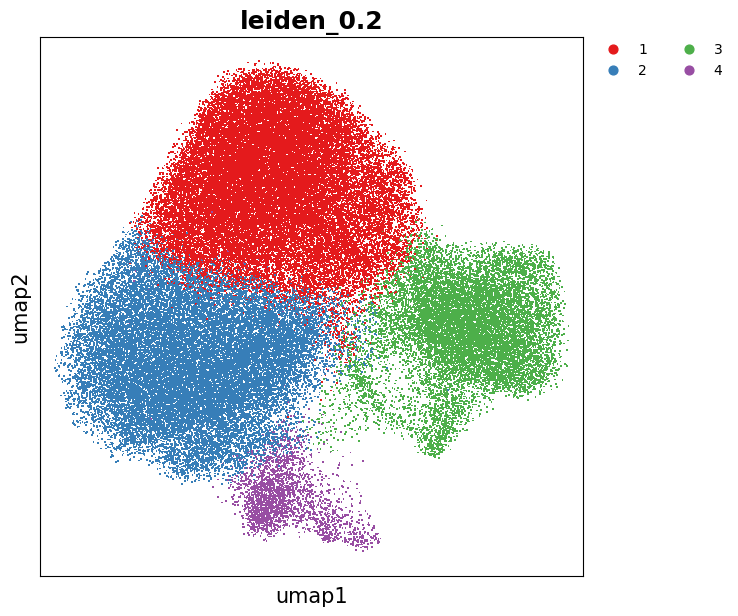

In [13]:
data.tl.leiden(neighbors_res_key='neighbors', res_key='leiden_0.2', resolution=0.2)
data.plt.cluster_scatter(res_key='leiden_0.2')
data.plt.umap(res_key='umap', cluster_key='leiden_0.2')

[2023-02-03 14:02:50][Stereo][57180][139909146240832][st_pipeline][40][INFO]: start to run leiden...
[2023-02-03 14:03:05][Stereo][57180][139909146240832][st_pipeline][43][INFO]: leiden end, consume time 15.3072s.


<AxesSubplot:title={'center':'leiden_0.6'}, xlabel='umap1', ylabel='umap2'>

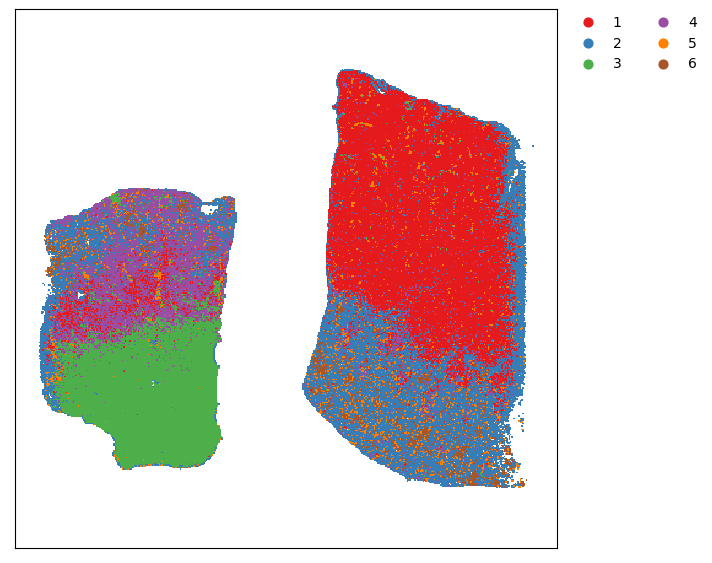

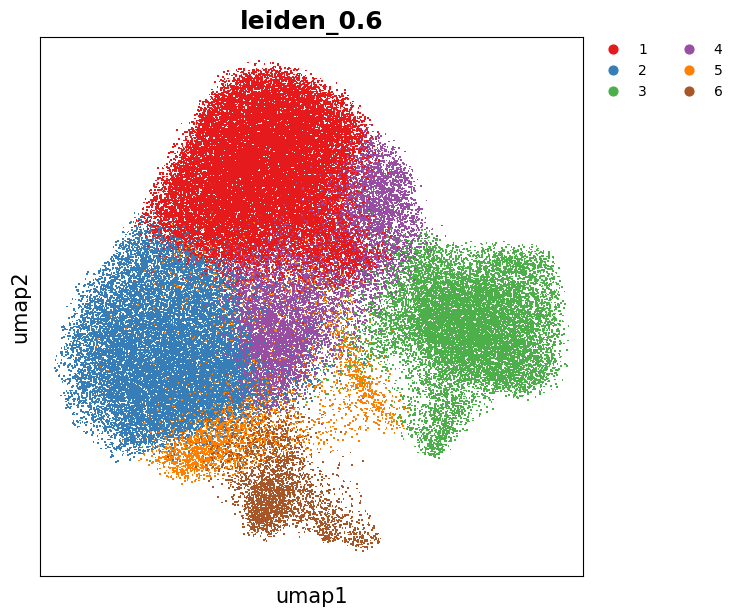

In [14]:
data.tl.leiden(neighbors_res_key='neighbors', res_key='leiden_0.6', resolution=0.6)
data.plt.cluster_scatter(res_key='leiden_0.6')
data.plt.umap(res_key='umap', cluster_key='leiden_0.6')

In [15]:
outkey_record = {'cluster':['leiden_0.2','leiden_0.6','louvain_0.3','louvain_0.8'],}
st.io.write_h5ad(data, use_raw=True, use_result=True, key_record=outkey_record, output='./952BR_E4.bin50.h5ad')

[2023-02-03 14:03:07][Stereo][57180][139909146240832][data][72][WARNING]: the output file is exists, we will replace it with new file.


In [16]:
#data.tl.phenograph(phenograph_k=30, pca_res_key='pca', res_key='phenograph')
#data.plt.cluster_scatter(res_key='phenograph')
#data.plt.umap(res_key='umap', cluster_key='phenograph')

In [17]:
# data.tl.gaussian_smooth(n_neighbors=10, smooth_threshold=90 inplace=False, res_key="gs")
# data.tl.scale(max_value=10) #only for gaussian_smooth_scatter_by_gene

In [18]:
#data.tl.find_marker_genes(cluster_res_key='louvain_0.3', method='t_test', use_highly_genes=False, use_raw=False, hvg_res_key="hvg_nt", 
#                          res_key='marker_louvain_0.3', output="marker_gene/952BR_E4.louvain_0.3.marker_gene.csv")
#data.tl.find_marker_genes(cluster_res_key='louvain_0.8', method='t_test', use_highly_genes=False, use_raw=False, hvg_res_key="hvg_nt", 
#                          res_key='marker_louvain_0.8', output="marker_gene/952BR_E4.louvain_0.8.marker_gene.csv")
#data.tl.find_marker_genes(cluster_res_key='leiden_0.2', method='t_test', use_highly_genes=False, use_raw=False, hvg_res_key="hvg_nt", 
#                          res_key='marker_leiden_0.2', output="marker_gene/952BR_E4.leiden_0.2.marker_gene.csv")
data.tl.find_marker_genes(cluster_res_key='leiden_0.6', method='t_test', use_highly_genes=False, use_raw=False, hvg_res_key="hvg_nt", 
                          res_key='marker_leiden_0.6', output="marker_gene/952BR_E4.leiden_0.6.marker_gene.csv")

[2023-02-03 14:03:14][Stereo][57180][139909146240832][st_pipeline][40][INFO]: start to run find_marker_genes...
[2023-02-03 14:03:14][Stereo][57180][139909146240832][tool_base][117][INFO]: read group information, grouping by group column.
[2023-02-03 14:03:14][Stereo][57180][139909146240832][tool_base][155][INFO]: start to run...
Find marker gene:   0%|          | 0/6 [00:00<?, ?it/s][2023-02-03 14:03:14][Stereo][57180][139909146240832][find_markers][119][INFO]: start to select group
[2023-02-03 14:03:17][Stereo][57180][139909146240832][find_markers][122][INFO]: end selelct group
Find marker gene:  17%|█▋        | 1/6 [00:08<00:40,  8.16s/it][2023-02-03 14:03:22][Stereo][57180][139909146240832][find_markers][119][INFO]: start to select group
[2023-02-03 14:03:25][Stereo][57180][139909146240832][find_markers][122][INFO]: end selelct group
Find marker gene:  33%|███▎      | 2/6 [00:16<00:33,  8.42s/it][2023-02-03 14:03:31][Stereo][57180][139909146240832][find_markers][119][INFO]: start t

FileNotFoundError: [Errno 2] No such file or directory: 'marker_gene/952BR_E4.leiden_0.6.marker_gene.csv'

In [ ]:
#data.plt.marker_genes_heatmap(res_key='marker_louvain_0.3', cluster_res_key='louvain_0.3', markers_num=5, do_log=True)
#data.plt.marker_genes_heatmap(res_key='marker_louvain_0.8', cluster_res_key='louvain_0.8', markers_num=5, do_log=True)
#data.plt.marker_genes_heatmap(res_key='marker_leiden_0.2', cluster_res_key='leiden_0.2', markers_num=5, do_log=True)
data.plt.marker_genes_heatmap(res_key='marker_leiden_0.6', cluster_res_key='leiden_0.6', markers_num=10, do_log=True)

In [26]:
## load processed data
data = st.io.read_stereo_h5ad('./952BR_E4.bin50.h5ad')

In [43]:
marker_list = ['Nphs1', 'Ncam1', 'Slc34a1', 'Slc7a12', 
                'Havcr1', 'Fst', 'Atp10b', 'Slc12a1', 'Nos1',
                'Slc12a3', 'Slc8a1', 'Aqp2', 'Kit', 'Slc26a4',
                'Flt1', 'Ren1', 'Ptprc']
marker_list_use = [i for i in marker_list if i in data.gene_names]

fig = data.plt.umap(gene_names=marker_list_use, res_key='umap')

In [43]:
marker_list = ['Aqp1', 'Aqp2', 'Slc12a1', 'Slc12a3', 
                'Slc14a2', 'Slc22a6', 'Slc34a1', 'Slc4a1']
marker_list_use = [i for i in marker_list if i in data.gene_names]

fig = data.plt.umap(gene_names=marker_list_use, res_key='umap')

Exception: gene Ren1 do not exist in expression matrix

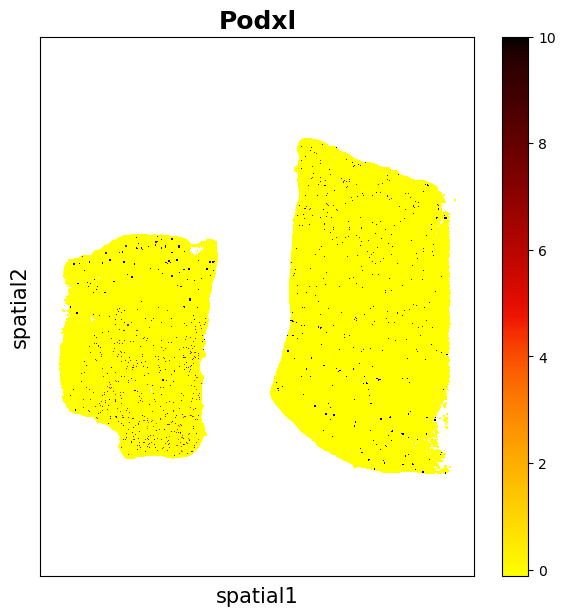

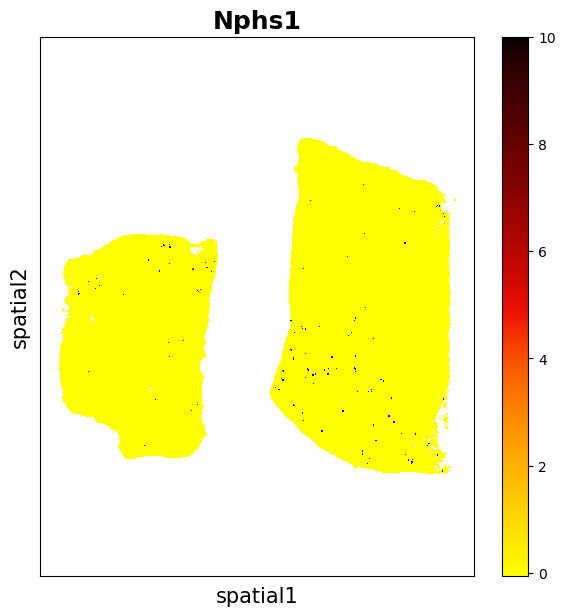

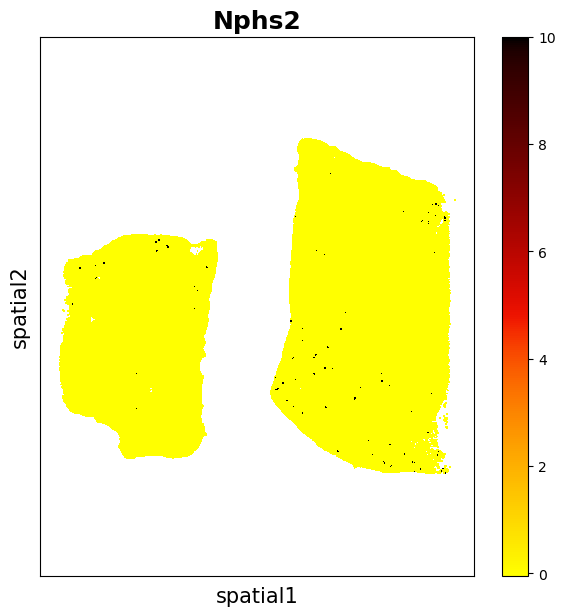

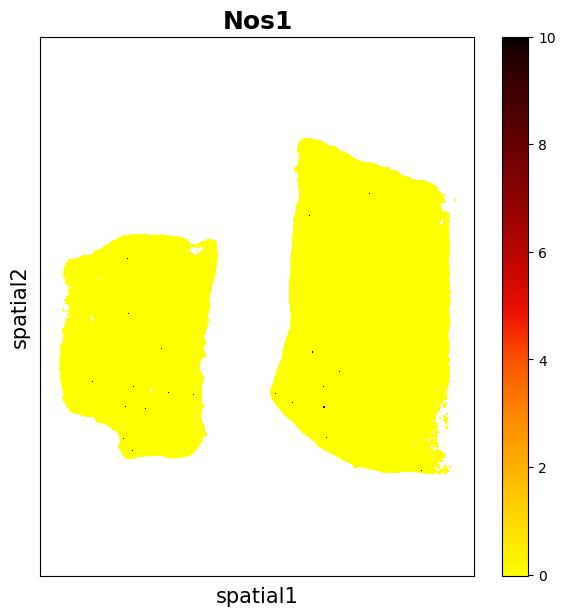

In [27]:
data.plt.spatial_scatter_by_gene(gene_name='Podxl')
data.plt.spatial_scatter_by_gene(gene_name='Nphs1')
data.plt.spatial_scatter_by_gene(gene_name='Nphs2')
data.plt.spatial_scatter_by_gene(gene_name='Nos1')
data.plt.spatial_scatter_by_gene(gene_name='Ren1')


In [ ]:
data.plt.spatial_scatter_by_gene(gene_name='Hnf4a')
data.plt.spatial_scatter_by_gene(gene_name='Slc5a12')
data.plt.spatial_scatter_by_gene(gene_name='Slc22a6')
data.plt.spatial_scatter_by_gene(gene_name='Slc34a1')
data.plt.spatial_scatter_by_gene(gene_name='Slc7a13')
data.plt.spatial_scatter_by_gene(gene_name='Slc7a12')
data.plt.spatial_scatter_by_gene(gene_name='Havcr1')
data.plt.spatial_scatter_by_gene(gene_name='Mki67')


Exception: gene Slc14a2 do not exist in expression matrix

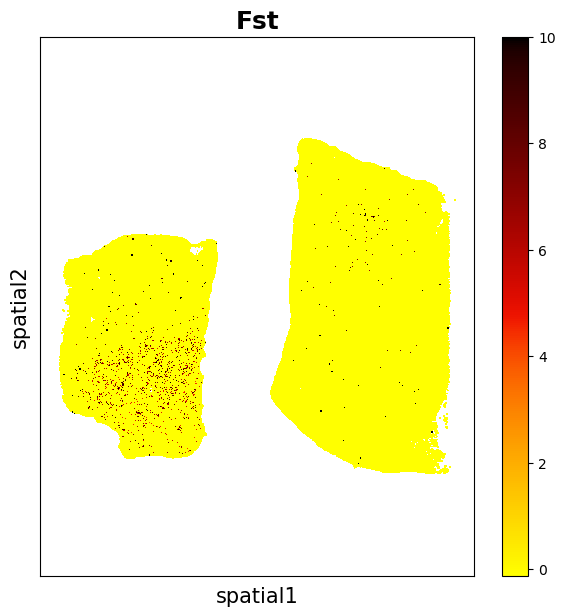

In [13]:
data.plt.spatial_scatter_by_gene(gene_name='Fst')
# data.plt.spatial_scatter_by_gene(gene_name='Slc14a2')
data.plt.spatial_scatter_by_gene(gene_name='Aqp1')
data.plt.spatial_scatter_by_gene(gene_name='Atp10b')
data.plt.spatial_scatter_by_gene(gene_name='Umod')
data.plt.spatial_scatter_by_gene(gene_name='Slc12a1')


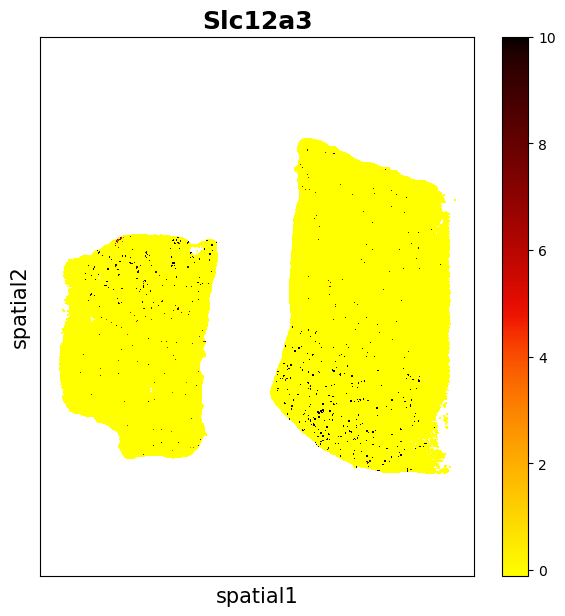

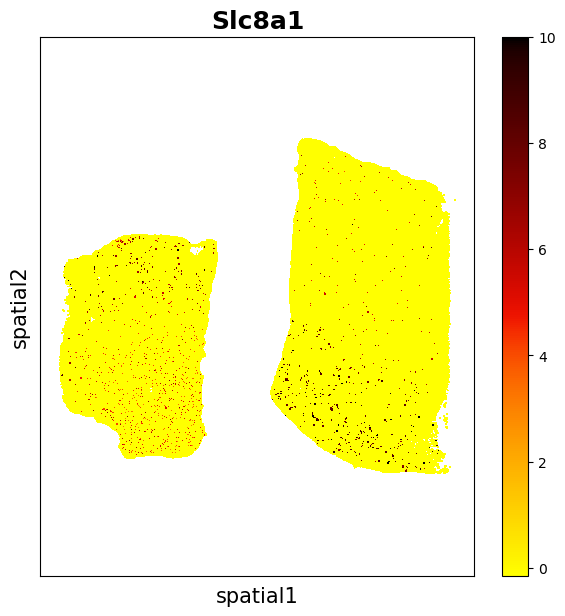

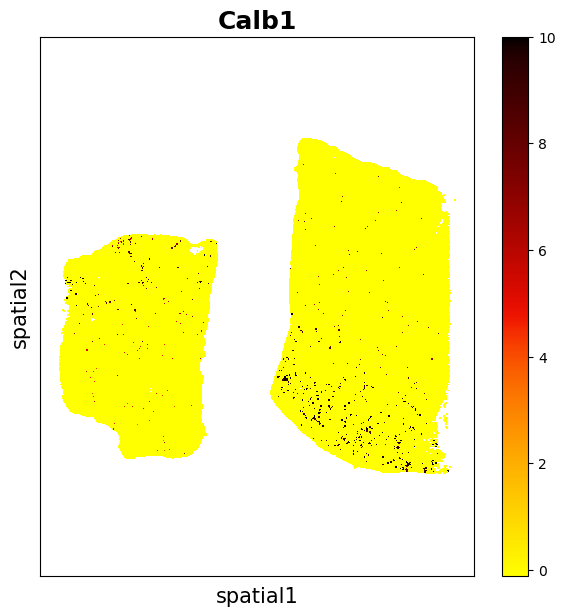

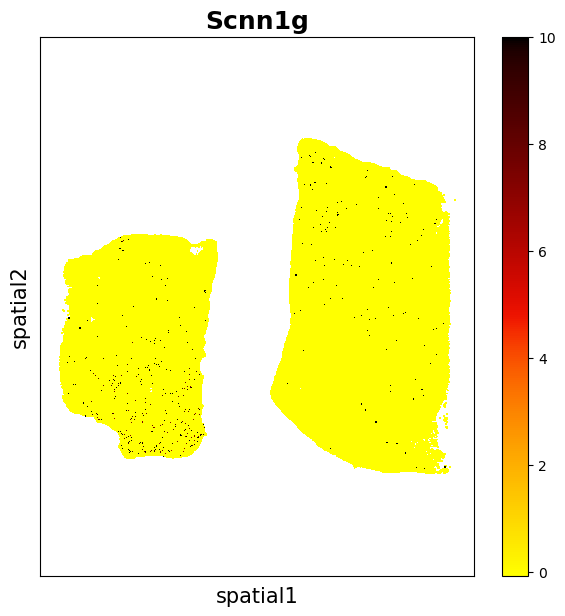

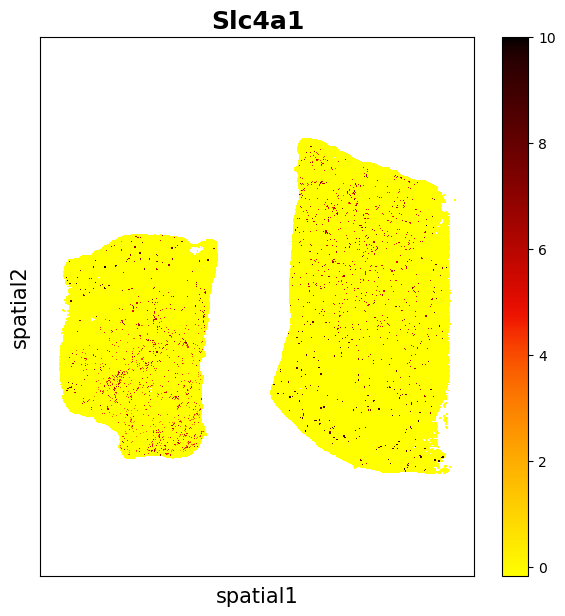

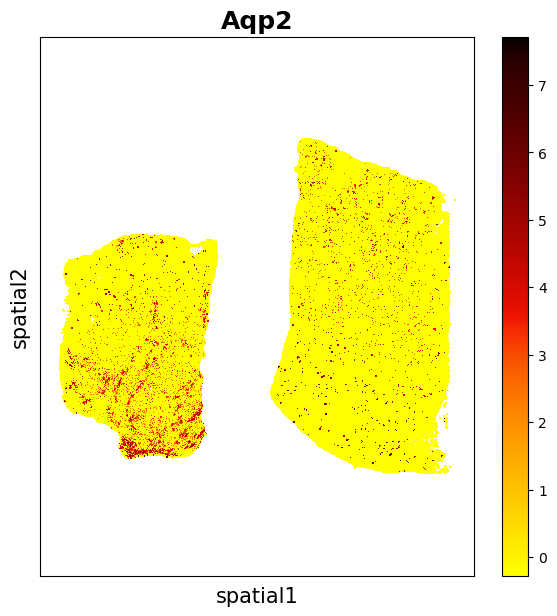

In [14]:
data.plt.spatial_scatter_by_gene(gene_name='Slc12a3')
data.plt.spatial_scatter_by_gene(gene_name='Slc8a1')
data.plt.spatial_scatter_by_gene(gene_name='Calb1')
data.plt.spatial_scatter_by_gene(gene_name='Scnn1g')
data.plt.spatial_scatter_by_gene(gene_name='Slc4a1')
data.plt.spatial_scatter_by_gene(gene_name='Aqp2')


Exception: gene Flt1 do not exist in expression matrix

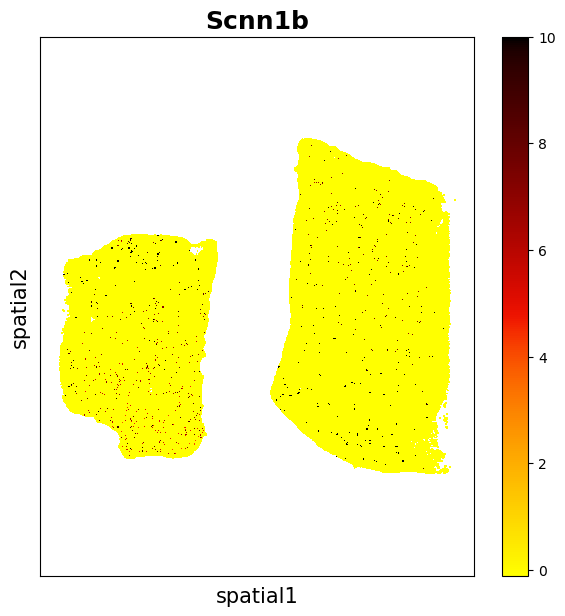

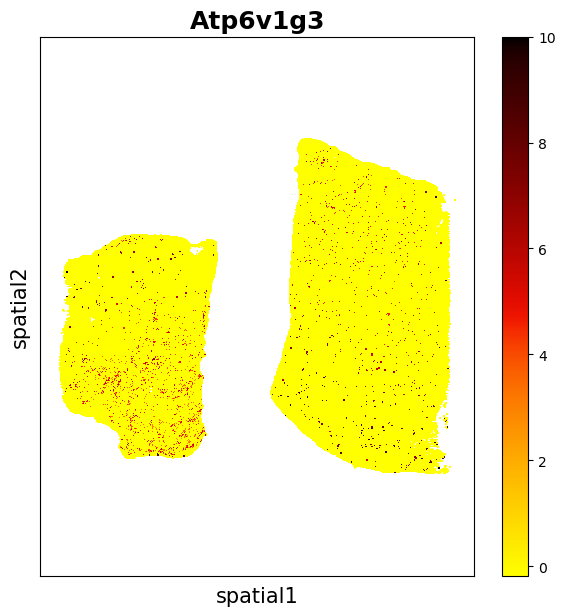

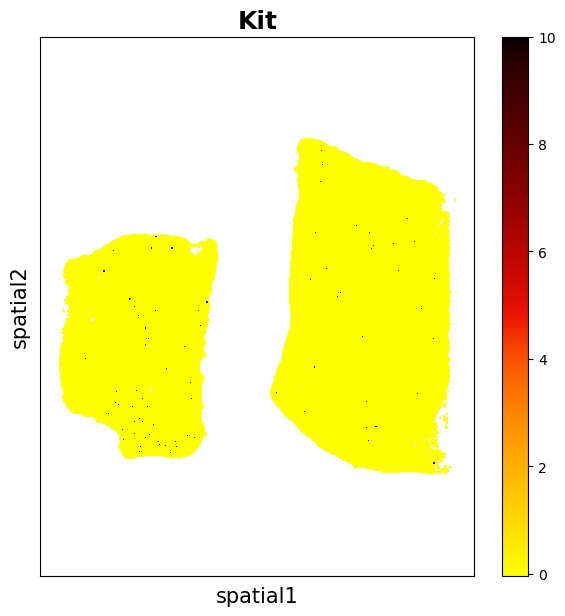

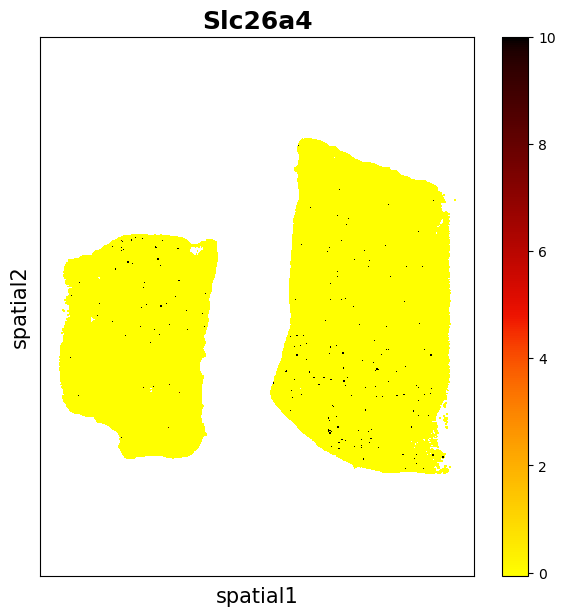

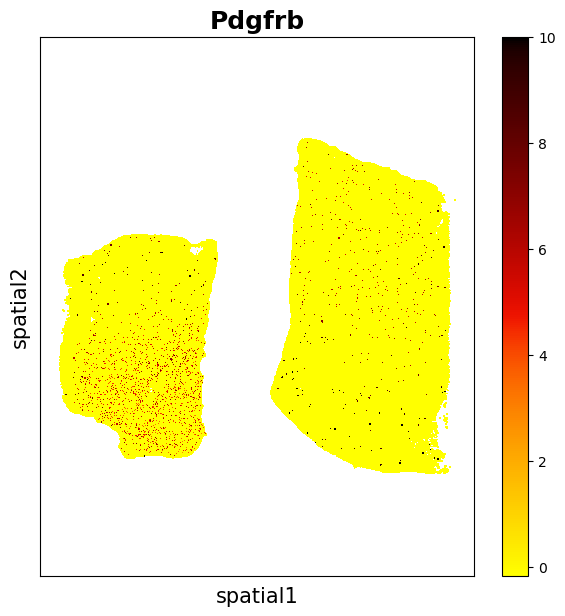

In [15]:
data.plt.spatial_scatter_by_gene(gene_name='Scnn1b')
data.plt.spatial_scatter_by_gene(gene_name='Atp6v1g3')
data.plt.spatial_scatter_by_gene(gene_name='Kit')
data.plt.spatial_scatter_by_gene(gene_name='Slc26a4')
data.plt.spatial_scatter_by_gene(gene_name='Pdgfrb')
#data.plt.spatial_scatter_by_gene(gene_name='Flt1')
data.plt.spatial_scatter_by_gene(gene_name='Vwf')
data.plt.spatial_scatter_by_gene(gene_name='Plvap')
data.plt.spatial_scatter_by_gene(gene_name='Slc14a1')
data.plt.spatial_scatter_by_gene(gene_name='Ptprc')

In [20]:
data.shape

(77323, 16072)

In [11]:
data.tl.spatial_hotspot(use_highly_genes=False, hvg_res_key=['Podxl', 'Nphs1'])

[2023-02-08 09:59:03][Stereo][268304][140516709861184][st_pipeline][40][INFO]: start to run spatial_hotspot...
[2023-02-08 09:59:06][Stereo][268304][140516709861184][spatial_hotspot][48][INFO]: create the Hotspot object with 16072 genes and 77323 cells, model=normal.
[2023-02-08 09:59:19][Stereo][268304][140516709861184][spatial_hotspot][50][INFO]: create_knn_graph with n_neighbors=30.
[2023-02-08 09:59:21][Stereo][268304][140516709861184][spatial_hotspot][54][INFO]: Start compute_autocorrelations.
100%|██████████| 16072/16072 [08:15<00:00, 32.42it/s]
[2023-02-08 10:07:44][Stereo][268304][140516709861184][spatial_hotspot][58][INFO]: Remain 5019 genes whose FDR < 0.05.
[2023-02-08 10:07:44][Stereo][268304][140516709861184][spatial_hotspot][60][INFO]: Start compute_local_correlations.


Computing pair-wise local correlation on 5019 features...


 20%|█▉        | 2509146/12592671 [3:03:48<12:18:41, 227.51it/s]
Process ForkPoolWorker-26:
Process ForkPoolWorker-31:
Process ForkPoolWorker-40:
Process ForkPoolWorker-29:
Process ForkPoolWorker-23:
Process ForkPoolWorker-28:
Process ForkPoolWorker-32:
Process ForkPoolWorker-33:
Process ForkPoolWorker-24:
Process ForkPoolWorker-36:
Process ForkPoolWorker-22:
Process ForkPoolWorker-39:
Process ForkPoolWorker-38:
Process ForkPoolWorker-30:
Process ForkPoolWorker-35:
Process ForkPoolWorker-27:
Process ForkPoolWorker-25:
Process ForkPoolWorker-34:
Process ForkPoolWorker-21:
Process ForkPoolWorker-37:
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
  File "/home/qqiu/.conda/envs/stereopy/lib/python3.8/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
  File "/home/qqiu/.conda/envs/stereopy/lib/python3.8/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
Traceback (most recent call last):
Traceback (

  File "/home/qqiu/.conda/envs/stereopy/lib/python3.8/multiprocessing/pool.py", line 125, in worker
    result = (True, func(*args, **kwds))
  File "/home/qqiu/.conda/envs/stereopy/lib/python3.8/multiprocessing/pool.py", line 125, in worker
    result = (True, func(*args, **kwds))
  File "/home/qqiu/.conda/envs/stereopy/lib/python3.8/site-packages/hotspot/local_stats_pairs.py", line 829, in _map_fun_parallel_pairs_centered_cond
    return _compute_hs_pairs_inner_centered_cond_sym(
  File "/home/qqiu/.conda/envs/stereopy/lib/python3.8/multiprocessing/pool.py", line 125, in worker
    result = (True, func(*args, **kwds))
  File "/home/qqiu/.conda/envs/stereopy/lib/python3.8/site-packages/hotspot/local_stats_pairs.py", line 829, in _map_fun_parallel_pairs_centered_cond
    return _compute_hs_pairs_inner_centered_cond_sym(
  File "/home/qqiu/.conda/envs/stereopy/lib/python3.8/site-packages/hotspot/local_stats_pairs.py", line 829, in _map_fun_parallel_pairs_centered_cond
    return _compute

KeyboardInterrupt: 

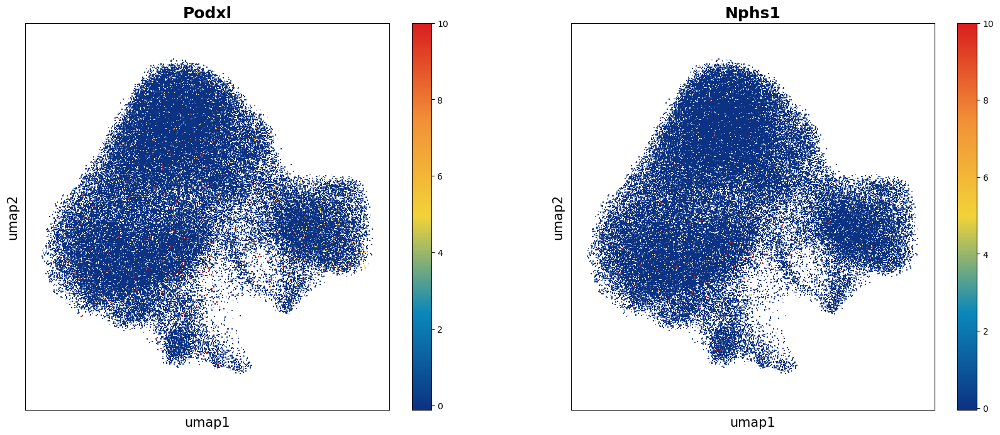

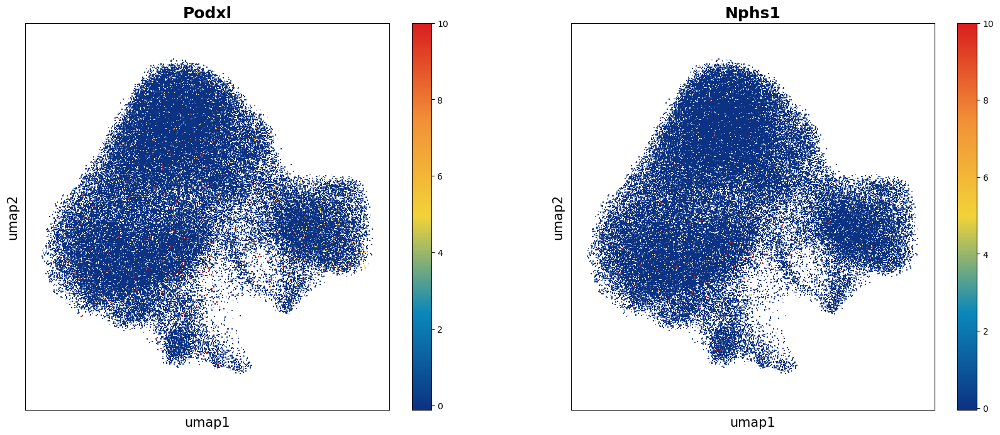

In [20]:
data.plt.umap(gene_names=['Podxl', 'Nphs1'], res_key='umap')

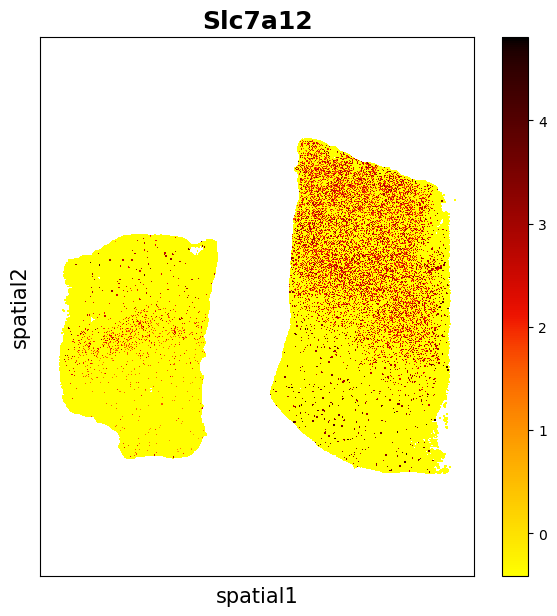

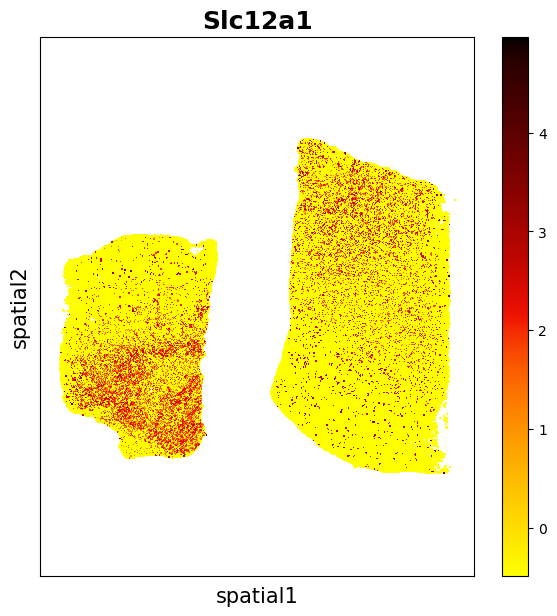

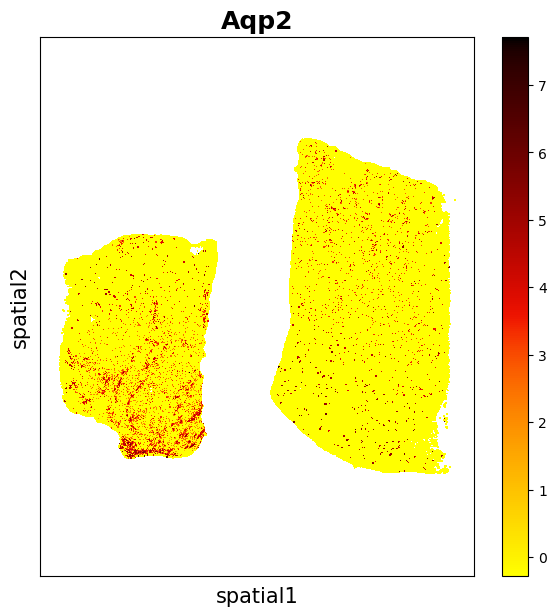

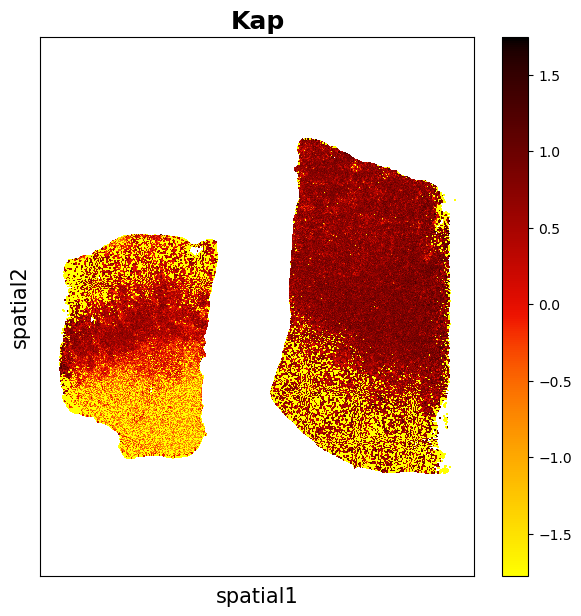

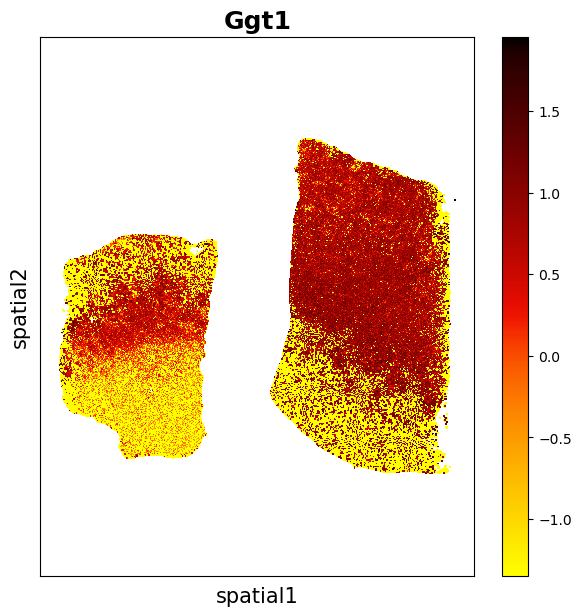

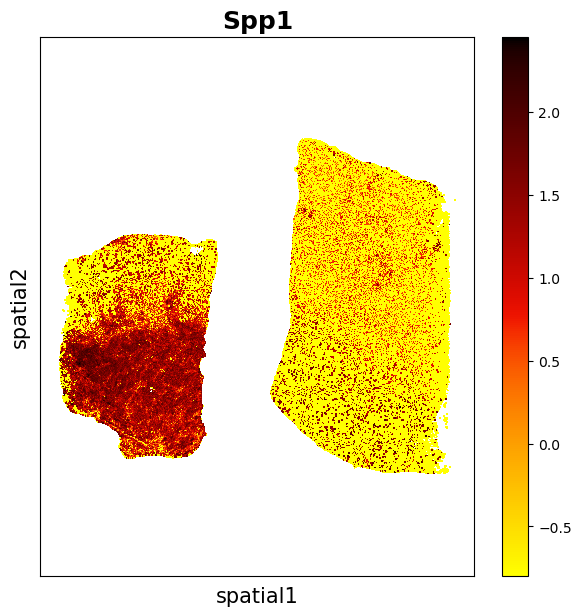

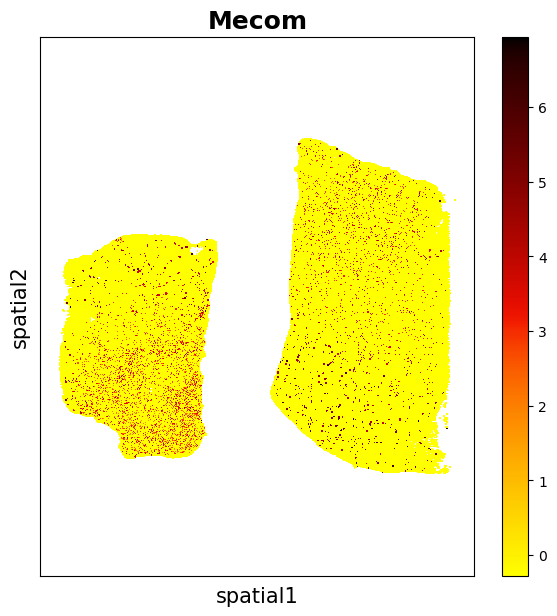

In [56]:
data.plt.spatial_scatter_by_gene(gene_name='Slc7a12')
data.plt.spatial_scatter_by_gene(gene_name='Slc12a1')
data.plt.spatial_scatter_by_gene(gene_name='Aqp2')
data.plt.spatial_scatter_by_gene(gene_name='Kap')
data.plt.spatial_scatter_by_gene(gene_name='Ggt1')
data.plt.spatial_scatter_by_gene(gene_name='Spp1')
data.plt.spatial_scatter_by_gene(gene_name='Mecom')